# Mask R-CNN Demo

A quick intro to using the pre-trained model to detect and segment objects.

In [1]:
import os
import sys
import scipy
import random
import math
import numpy as np
import skimage.io
import matplotlib
import matplotlib.pyplot as plt
import datetime
import tensorflow as tf


import cv2
%matplotlib inline

# Root directory of the project
ROOT_DIR = os.path.abspath("../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize


from samples.carton import carton

# Import COCO config
#sys.path.append(os.path.join(ROOT_DIR, "samples/balloon/"))  # To find local version
CARTON_DIR = os.path.join(ROOT_DIR, "datasets/carton")

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
CARTON_WEIGHTS_PATH = os.path.join(ROOT_DIR, "mask_rcnn_carton_0610.h5")

# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR, "images")

# ROS packages
import rospy
import geometry_msgs.msg
import time
import roslib; roslib.load_manifest('ur_driver')
import actionlib
from std_msgs.msg import String
# ROS Image message
from sensor_msgs.msg import Image
from thin_obj_bin_picking.msg import carton_pose
# ROS Image message -> OpenCV2 image converter
from cv_bridge import CvBridge, CvBridgeError
#import tf

Using TensorFlow backend.


## Configurations

We'll be using a model trained on the MS-COCO dataset. The configurations of this model are in the ```CocoConfig``` class in ```coco.py```.

For inferencing, modify the configurations a bit to fit the task. To do so, sub-class the ```CocoConfig``` class and override the attributes you need to change.

In [2]:
config = carton.CartonConfig()
CARTON_DIR = os.path.join(ROOT_DIR, "datasets/carton")

# Override the training configurations with a few
# changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                15
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

## Create Model and Load Trained Weights

In [3]:
# Create model in inference mode
DEVICE = "/gpu:0"  # /cpu:0 or /gpu:0

with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)



In [4]:
# Load weights trained on MS-COCO
model.load_weights(CARTON_WEIGHTS_PATH, by_name=True)

In [5]:
# Load validation dataset
dataset = carton.CartonDataset()
# dataset.load_carton(CARTON_DIR, "new_images")
dataset.load_carton(CARTON_DIR, "val")
# dataset.load_carton(CARTON_DIR, "real_carton_imgs/1img")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 64
Classes: ['BG', 'green_front', 'green_back']


## Class Names

The model classifies objects and returns class IDs, which are integer value that identify each class. Some datasets assign integer values to their classes and some don't. For example, in the MS-COCO dataset, the 'person' class is 1 and 'teddy bear' is 88. The IDs are often sequential, but not always. The COCO dataset, for example, has classes associated with class IDs 70 and 72, but not 71.

To improve consistency, and to support training on data from multiple sources at the same time, our ```Dataset``` class assigns it's own sequential integer IDs to each class. For example, if you load the COCO dataset using our ```Dataset``` class, the 'person' class would get class ID = 1 (just like COCO) and the 'teddy bear' class is 78 (different from COCO). Keep that in mind when mapping class IDs to class names.

To get the list of class names, you'd load the dataset and then use the ```class_names``` property like this.
```
# Load COCO dataset
dataset = coco.CocoDataset()
dataset.load_coco(COCO_DIR, "train")
dataset.prepare()

# Print class names
print(dataset.class_names)
```

We don't want to require you to download the COCO dataset just to run this demo, so we're including the list of class names below. The index of the class name in the list represent its ID (first class is 0, second is 1, third is 2, ...etc.)

In [6]:
class_names = dataset.class_names

## Run Object Detection

In [7]:
# Rank the mask areas, output the maximum area
def max_area(area):
    area_max = 0
    index = 0
    for i, a in enumerate(area):
        if(a > area_max):
            area_max = a
            index = i
    return area_max, index

In [8]:
# Select the maximum area mask, output the mask and its corners
def mask_rank(img, mask):
    mask_int = mask.astype(np.uint8)
    area = np.zeros([mask_int.shape[2]], dtype=np.int)
    boxx = np.zeros([4, 2, mask_int.shape[2]], dtype = np.float)
    img_copy = img.copy()
    for i in range(mask_int.shape[2]):        
        mask_copy = mask_int[:,:,i].copy()
        plt.imshow(mask_copy)
        plt.show()
        area[i] = mask_copy.sum()
        print(area[i])
    
    mmax, index = max_area(area)
    im2,contours,hierarchy = cv2.findContours(mask_int[:,:,index].copy(), 1, 2)
    cnt = contours[0]     
    for j in range(len(contours)):
        if(len(contours[j]) > len(cnt)):
            cnt = contours[j]
    hull = cv2.convexHull(cnt,returnPoints = True)
    rect = cv2.minAreaRect(hull)
    box = cv2.boxPoints(rect)
    box = np.int0(box)
    cv2.drawContours(img_copy,[box],0,(0,0,255),2)
    plt.imshow(img_copy)
    plt.show()
    print(box)
    return mask_int[:,:,index].copy(), box

In [9]:
# Compute position of mask center and rotation of mask
def get_mask_pose(max_boxx):
    position = (max_boxx[0] + max_boxx[2]) / 2
    # Counterclockwise is positive direction
    if(np.linalg.norm(max_boxx[0]-max_boxx[1]) > np.linalg.norm(max_boxx[1]-max_boxx[2])):
        rotation = math.atan2((max_boxx[2]-max_boxx[1])[1], (max_boxx[2]-max_boxx[1])[0])
        print("rotation 111")
    else:
        rotation = math.atan2((max_boxx[1]-max_boxx[0])[1], (max_boxx[1]-max_boxx[0])[0])
        print("rotation 222")
    pose={
        'x':position[0],
        'y':position[1],
        'rz':rotation
    }
    return pose

In [10]:
is_detect = 0
img_index = 0
def img_index_callback(data):
    global img_index
    global is_detect
    
    print(data.data)
    img_index = data.data
    is_detect = 1


In [11]:
rospy.init_node('img_segmentation')
rospy.Subscriber('/carton_img_index', String, img_index_callback)

functions for carton pose detection

In [12]:
def get_max_area_mask(masks):
    #get the number of masks
    mask_num = masks.shape[2]
    
    largest_mask_idx = 0
    largest_mask_area = 0
    for index in range(mask_num):        
        mask = r['masks'][:,:,index]
        
        #get the area of masks[index]
        temp_mask_pixel_sum = 0
        for row in mask:
            temp_mask_pixel_sum += sum(row)
        
        #compare the result with the 
        if (temp_mask_pixel_sum > largest_mask_area):
            largest_mask_area = temp_mask_pixel_sum
            largest_mask_idx = index
    
    return largest_mask_idx



In [13]:
direct_i = [-1,  0, 1, 0]
direct_j = [ 0, -1, 0, 1]
    

def set_father(i, j, new_father_id, father):
    original_father = father[i][j]
    father[i][j] = new_father_id
    shape=father.shape
    
    for k in range(4):
        if (i+direct_i[k] < shape[0]) and (i+direct_i[k] >= 0) and (j+direct_j[k] < shape[1]) and (j+direct_j[k] >= 0) and (father[i+direct_i[k]][j+direct_j[k]] == original_father):
            set_father(i+direct_i[k], j+direct_j[k], new_father_id, father)

    
def get_largest_region(mask):
    
    shape = mask.shape
    father = np.zeros(shape, dtype=np.uint8)    
    
    father_maximum = 0
    
    for i in range(shape[0]):
        for j in range(shape[1]):
            if (mask[i][j] != 0):

                new_father_flag = 1
                for k in range(4):
                    if (i+direct_i[k] < shape[0]) and (i+direct_i[k] >= 0) and (j+direct_j[k] < shape[1]) and (j+direct_j[k] >= 0) and mask[i+direct_i[k]][j+direct_j[k]] != 0 and father[i+direct_i[k]][j+direct_j[k]] != 0:
                        new_father_flag = 0
                        if father[i][j] == 0:
                            father[i][j] = father[i+direct_i[k]][j+direct_j[k]]
                        elif father[i][j] != father[i+direct_i[k]][j+direct_j[k]]:
                            set_father(i, j, father[i+direct_i[k]][j+direct_j[k]], father)
                if new_father_flag == 1:
                    father_maximum += 1
                    father[i][j] = father_maximum
    area = np.zeros(father_maximum+1)
    for i in range(shape[0]):
        for j in range(shape[1]):
            if (mask[i][j] != 0):
                area[father[i][j]] += 1

    indexs = np.where(area == np.amax(area))
    max_area_idx = indexs[0][0]
    
    for i in range(shape[0]):
        for j in range(shape[1]):
            if (father[i][j] != max_area_idx):
                mask[i][j] = 0
    return mask

# mask = np.zeros((5, 5), dtype=np.uint8)

# mask[0][0] = 255
# mask[1][1] = 255
# mask[1][2] = 255
# mask[2][1] = 255
# mask[2][2] = 255
# mask[3][2] = 255

# mask[1][4] = 255
# mask[2][4] = 255

# mask[3][3] = 255
# mask[3][4] = 255

# mask[4][0] = 255
# mask[0][1] = 255

# print(mask)
# mask = get_largest_region(mask)
# print(mask)

In [14]:
import scipy
import cv2
import numpy as np
from matplotlib import pyplot as plt
import scipy.io as sio

def get_carton_pose(image, r):
#     img_index = 1
#     image =  scipy.misc.imread('/home/qxuaj/catkin_ws/src/thin_obj_bin_picking/image/'+ str(img_index) +'.jpeg')
    
    index = get_max_area_mask(r['masks'])              
    print("The largest area img is :", index)
    
    mask = r['masks'];
    mask1 = mask[:, :, index] * 255;
    mask1 = np.uint8(mask1)
    #print((mask1.max()))    
    
    #make the mask larger for robustness
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(20, 20))
    mask1 = cv2.dilate(mask1, kernel)
    
    
    #Erode and then dilate the image to eliminate the noise
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(30, 30))
    mask_eroded = cv2.erode(mask1, kernel)
    mask_dilated = cv2.dilate(mask_eroded, kernel)

    mask_dilated = cv2.dilate(mask_dilated, kernel)
    mask_dilated = cv2.erode(mask_dilated, kernel)
    
    #get the center of the carton
    ret,thresh = cv2.threshold(mask_dilated,127,255,0)
    im2,contours,hierarchy = cv2.findContours(thresh, 1, 2)
    cnt = contours[0]

    M_carton = cv2.moments(cnt)
    cx_carton = int(M_carton['m10']/M_carton['m00'])
    cy_carton = int(M_carton['m01']/M_carton['m00'])
    
    #filter the gree bar

#     lower_green = np.array([0,80,0])
#     upper_green = np.array([45,255,255])
    
    lower_green = np.array([0,80,0])
    upper_green = np.array([75,255,255])
    
    green_mask = cv2.inRange(image, lower_green, upper_green)
    res = cv2.bitwise_and(image,image, mask= green_mask)
    
    plt.figure(figsize=(8,8),dpi=80)
    plt.imshow(res)
    plt.title('green filter')
    
    mask_green_carton = cv2.bitwise_and(mask_dilated, green_mask)
    
    
    mask_green_carton_processed = mask_green_carton

    #Erode and then dilate the image to eliminate the noise
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(2, 2))
    mask_eroded = cv2.erode(mask_green_carton, kernel)
    mask_green_carton_processed = cv2.dilate(mask_eroded, kernel)
    
    #dilate and then erode the image to fill the words
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(9, 9))
    mask_dilated = cv2.dilate(mask_green_carton_processed, kernel)
    mask_green_carton_processed = cv2.erode(mask_dilated, kernel)
    
    print('green_max', np.amax(mask_green_carton_processed))
    print('shape', mask_green_carton_processed.shape)
    print('dtype', mask_green_carton_processed.dtype.name)
    
    
    mask_green_carton = get_largest_region(mask_green_carton_processed)
    
    
    
    
    plt.figure(figsize=(8,8),dpi=80)
    plt.imshow(mask_green_carton_processed)
    plt.title('mask_green_carton_processed')
    
    _, contours,hierarchy = cv2.findContours(mask_green_carton_processed,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
    cnt = contours[0]

    #calculate center point
    M = cv2.moments(cnt)
    cx = int(M['m10']/M['m00'])
    cy = int(M['m01']/M['m00'])
    
    #draw bounding point
    rect = cv2.minAreaRect(cnt)
    box = cv2.boxPoints(rect)
    box = np.int0(box)
    img_result = cv2.drawContours(image.copy(),[box],0,(0,0,255),8)

    #draw center point
    cv2.circle(img_result, (cx_carton, cy_carton), 8, (255, 0, 255), 8)
    
    center_points = [[0, 0], [0, 0], [0, 0], [0, 0]]
    center_dist = [[0, 0], [0, 1], [0, 2], [0, 3]]
    for i in range(4):
        center_points[i][0] = (box[i][0] + box[(i+1)%4][0]) / 2 
        center_points[i][1] = (box[i][1] + box[(i+1)%4][1]) / 2 
        center_dist[i][0] = math.sqrt((center_points[i][0] - cx)**2 + (center_points[i][1] - cy)**2)

    #get farest two centers
    for i in range(4):
        for j in range(i+1, 4):
            if (center_dist[i][0] < center_dist[j][0]):
                tmp = center_dist[i][0]
                center_dist[i][0] = center_dist[j][0]
                center_dist[j][0] = tmp

                tmp = center_dist[i][1]
                center_dist[i][1] = center_dist[j][1]
                center_dist[j][1] = tmp

    far_point1_x = int(center_points[center_dist[0][1]][0])
    far_point1_y = int(center_points[center_dist[0][1]][1])

    far_point2_x = int(center_points[center_dist[1][1]][0])
    far_point2_y = int(center_points[center_dist[1][1]][1])
    
    dist1 = math.sqrt((far_point1_x - cx_carton)**2 + (far_point1_y - cy_carton)**2)
    dist2 = math.sqrt((far_point2_x - cx_carton)**2 + (far_point2_y - cy_carton)**2)

    #update cx and cy real value
    cx = int((far_point1_x + far_point2_x) / 2)
    cy = int((far_point1_y + far_point2_y) / 2)
    cv2.circle(img_result, (cx, cy), 8, (255, 0, 0), 8)

    if dist1 < dist2:
        tilt_point_x = int(far_point1_x + (far_point1_x - cx) * (104.0 / 81.5)) #104/81.3
        tilt_point_y = int(far_point1_y + (far_point1_y - cy) * (104.0 / 81.5)) #104/81.3

        fixed_point_x = far_point2_x
        fixed_point_y = far_point2_y
    else:
        tilt_point_x = int(far_point2_x + (far_point2_x - cx) * (104.0 / 81.5))
        tilt_point_y = int(far_point2_y + (far_point2_y - cy) * (104.0 / 81.5))

        fixed_point_x = far_point1_x
        fixed_point_y = far_point1_y

    cv2.circle(img_result, (tilt_point_x, tilt_point_y), 8, (255, 255, 0), 8)
    cv2.circle(img_result, (fixed_point_x, fixed_point_y), 8, (0, 255, 0), 8)
    
    plt.figure(figsize=(8,8),dpi=80)
    plt.imshow(img_result)
    plt.title('img_result')

    #calculate angle
    dy = - (fixed_point_y - tilt_point_y)
    dx = fixed_point_x - tilt_point_x
    
    print('dy = '+str(dy)+' dx='+str(dx) )
    
    plt.show()
    pose={
        'Hong_x':tilt_point_x,
        'Hong_y':tilt_point_y,
        'Kong_x':fixed_point_x,
        'Kong_y':fixed_point_y,
        'rz':math.atan2(dy, dx)
    }
    return pose


    

In [15]:
sys.setrecursionlimit(500000)

1
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  231.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  102.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


/home/qxuaj/anaconda3/envs/tf_gpu/lib/python3.6/site-packages/ipykernel_launcher.py:19: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.


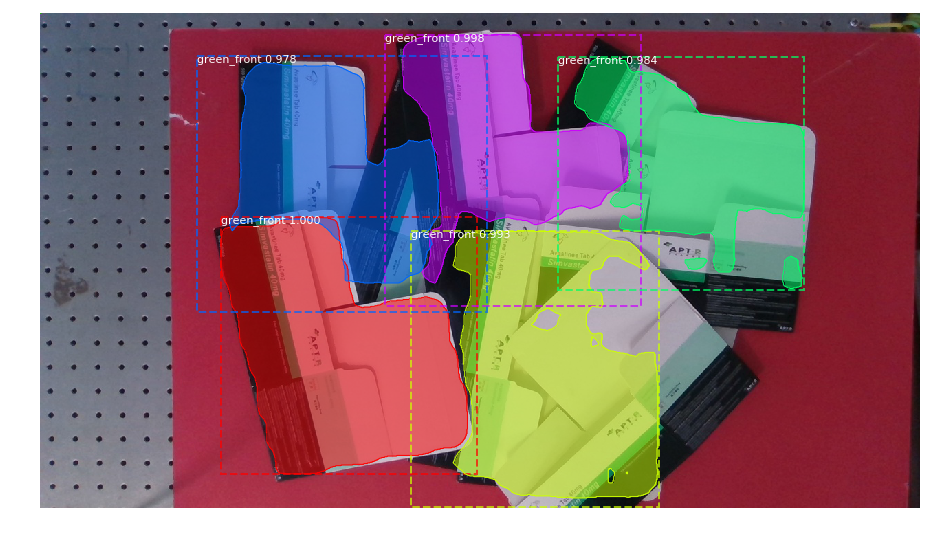

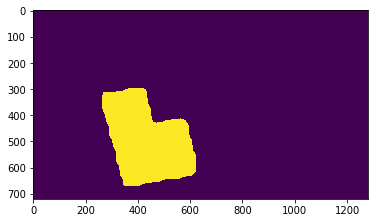

89966


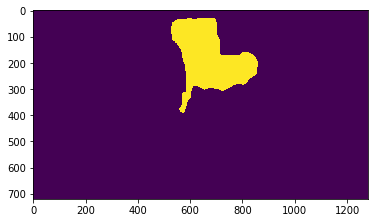

58229


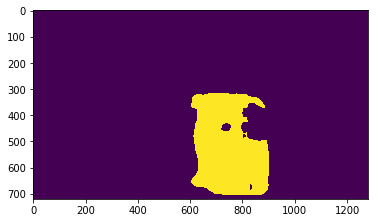

91061


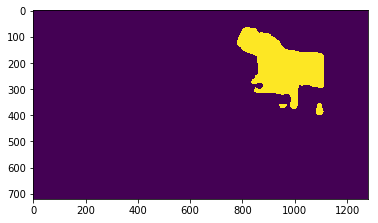

53810


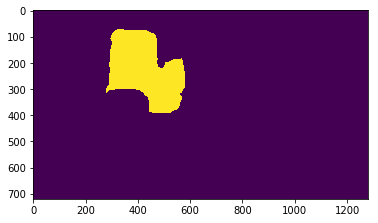

62314


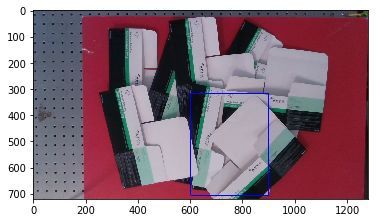

[[602 705]
 [602 317]
 [899 317]
 [899 705]]


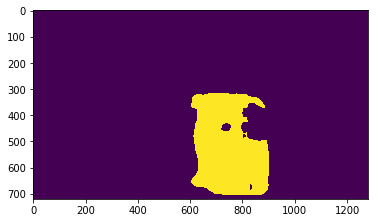

The largest area img is : 2
green_max 255
shape (720, 1280)
dtype uint8
dy = 349 dx=67


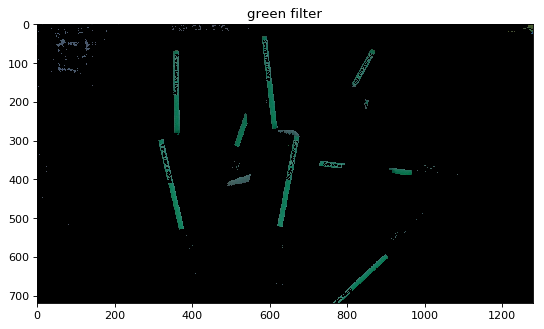

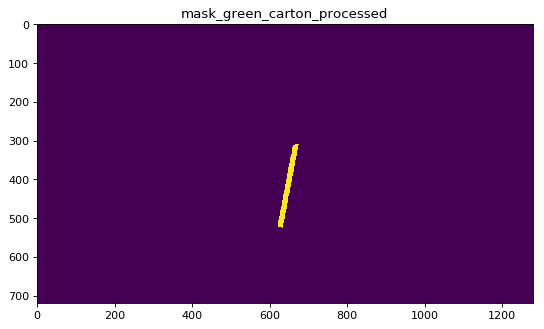

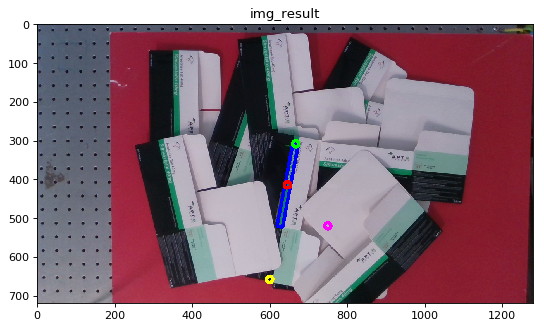

Hong: 600 659
Kong: 667 310
79.13274134078334
carton_pose_msg is  header: 
  seq: 1
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: -0.015545699999999999
Hong_y: 0.0358227
Kong_x: 0.0060831
Kong_y: 0.209529
angle: 1.3811268825257015

Hong: -0.015545699999999999   0.0358227
Kong: 0.0060831   0.209529
2
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  227.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  103.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


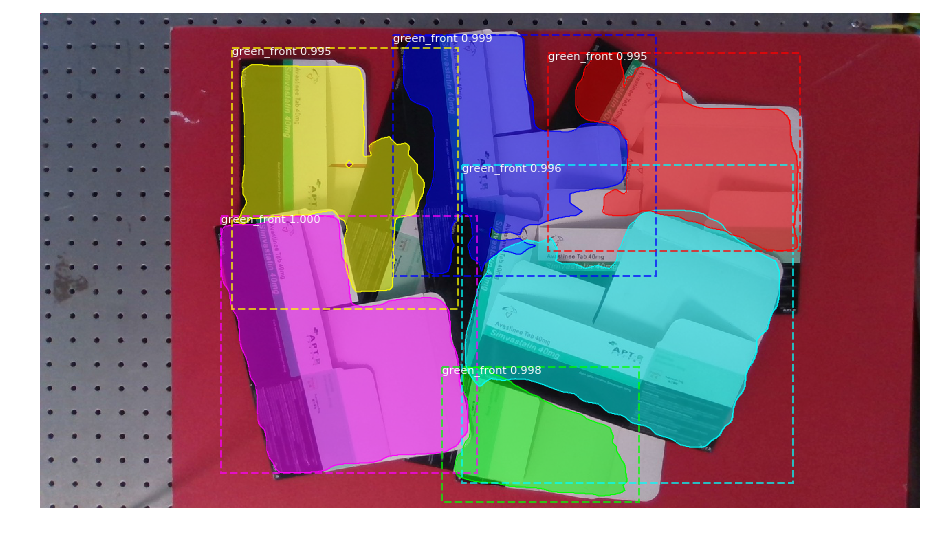

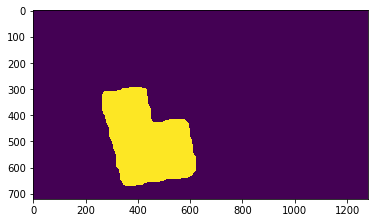

91311


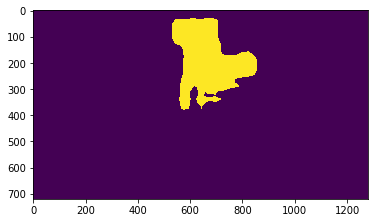

63547


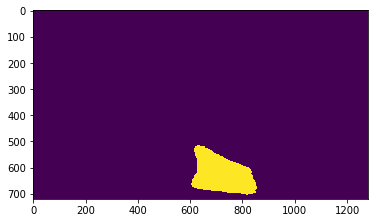

30022


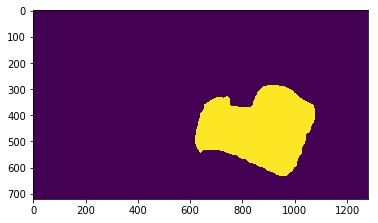

103986


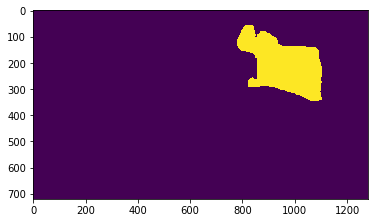

54370


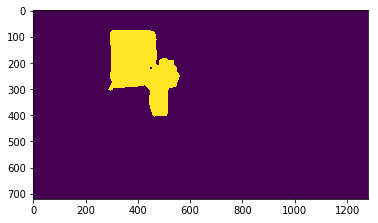

53591


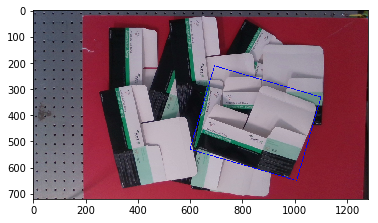

[[1007  649]
 [ 599  530]
 [ 693  212]
 [1100  331]]


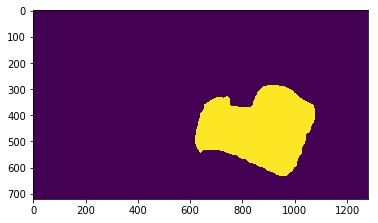

The largest area img is : 3
green_max 255
shape (720, 1280)
dtype uint8
dy = 172 dx=-198


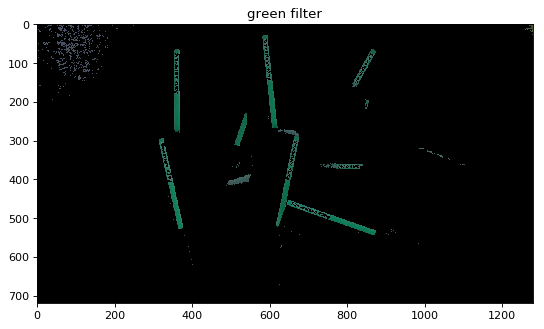

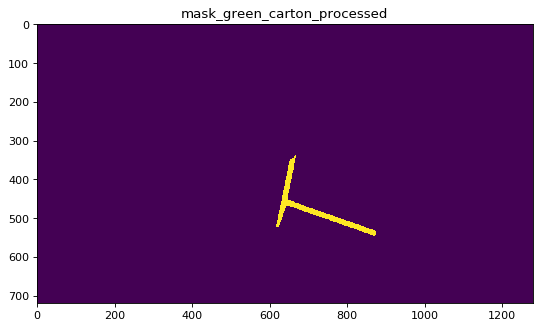

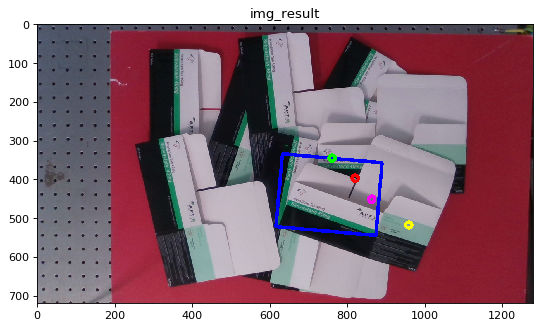

Hong: 959 519
Kong: 761 347
139.01958248783748
carton_pose_msg is  header: 
  seq: 2
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.22710239999999998
Hong_y: -0.058803299999999996
Kong_x: 0.0696177
Kong_y: 0.2345373
angle: 2.4263494391606137

Hong: 0.22710239999999998   -0.058803299999999996
Kong: 0.0696177   0.2345373
3
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  244.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  106.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


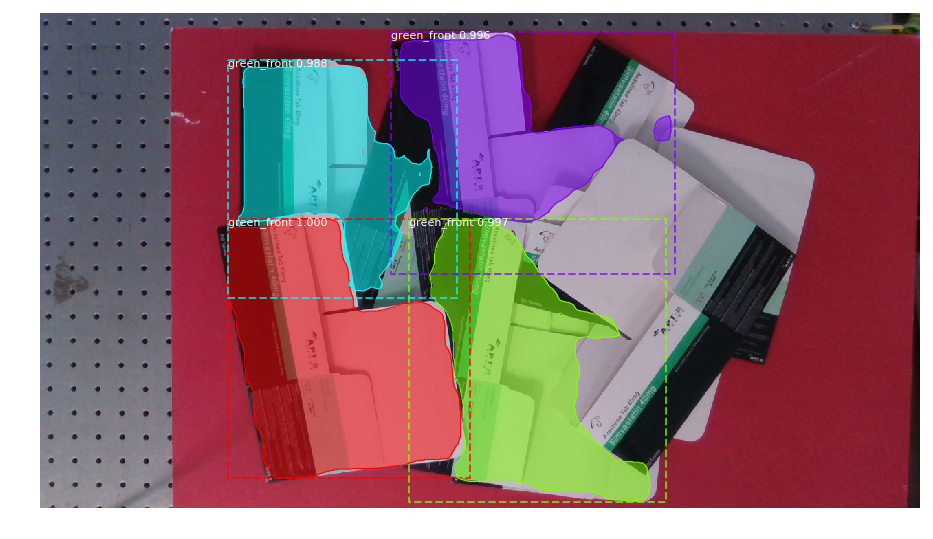

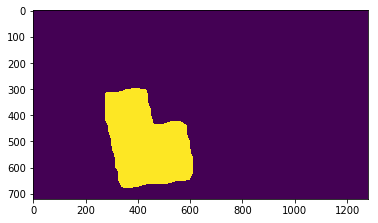

90476


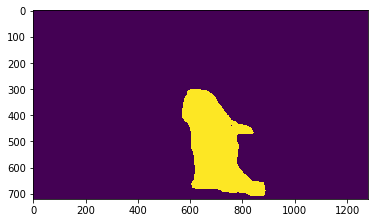

71523


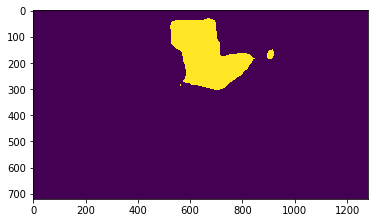

51135


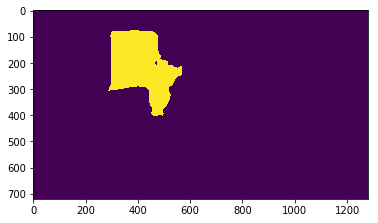

53298


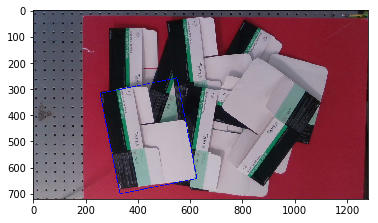

[[332 700]
 [256 317]
 [550 258]
 [626 641]]


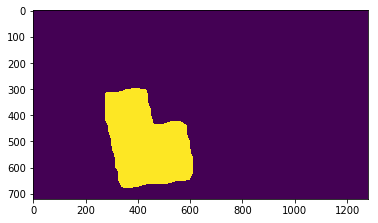

The largest area img is : 0
green_max 255
shape (720, 1280)
dtype uint8
dy = 376 dx=-68


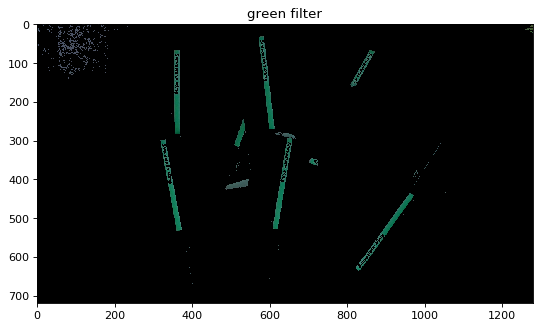

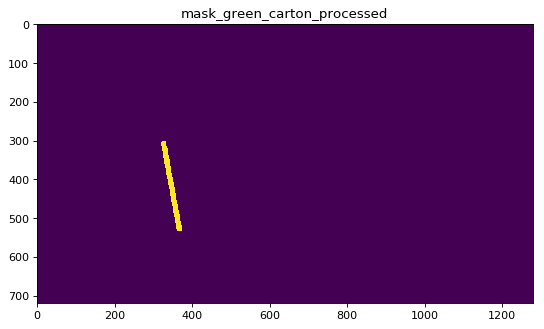

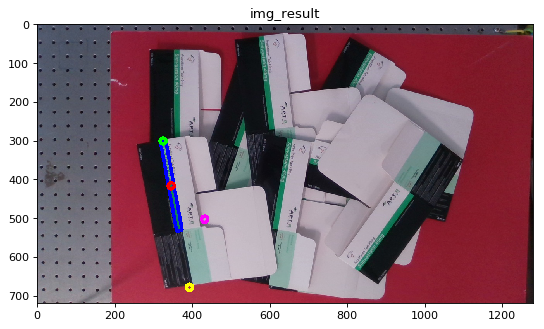

Hong: 393 679
Kong: 325 303
100.25119875081744
carton_pose_msg is  header: 
  seq: 3
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: -0.15545699999999998
Hong_y: 0.0493407
Kong_x: -0.2250747
Kong_y: 0.2047977
angle: 1.7497134972729906

Hong: -0.15545699999999998   0.0493407
Kong: -0.2250747   0.2047977
0
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  246.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  111.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


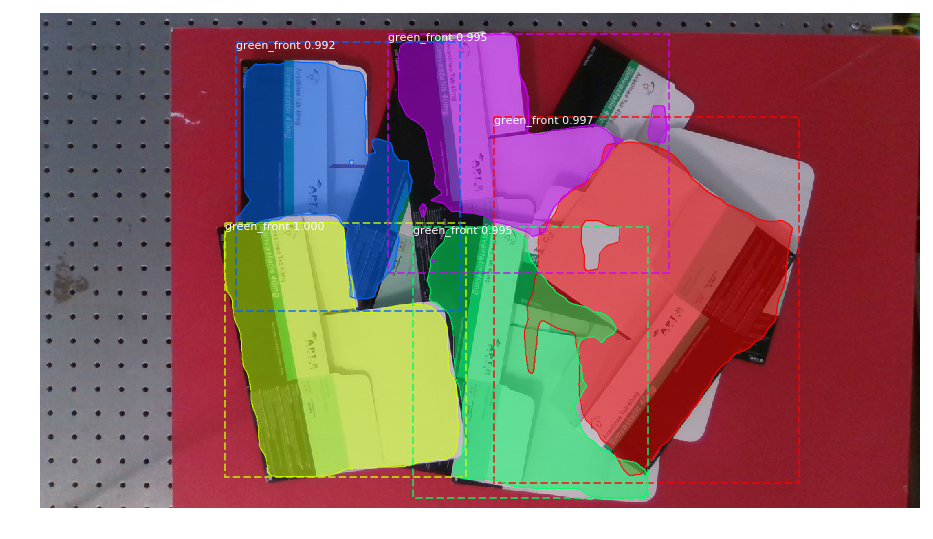

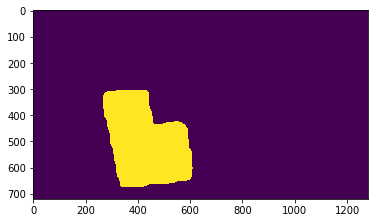

90870


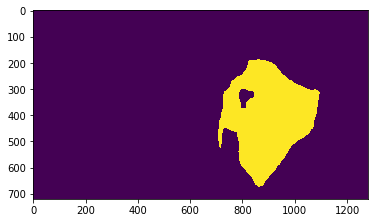

108549


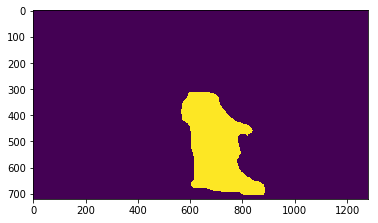

71849


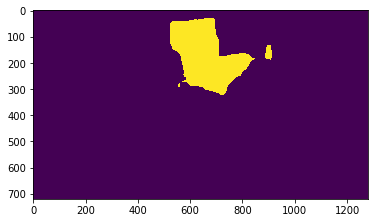

54026


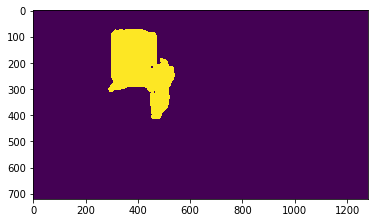

52523


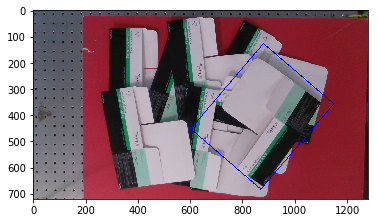

[[ 870  682]
 [ 602  452]
 [ 880  127]
 [1149  357]]


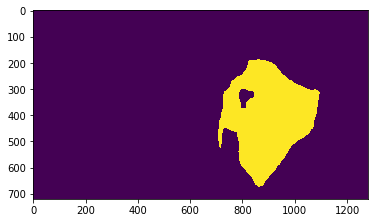

The largest area img is : 1
green_max 255
shape (720, 1280)
dtype uint8
dy = -319 dx=-231


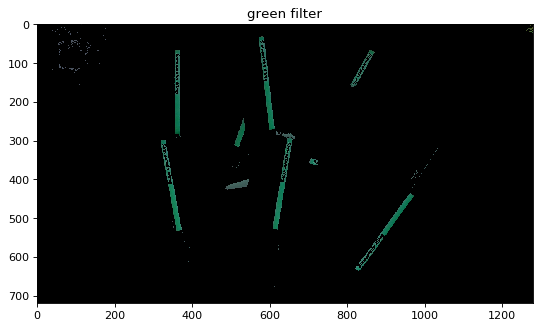

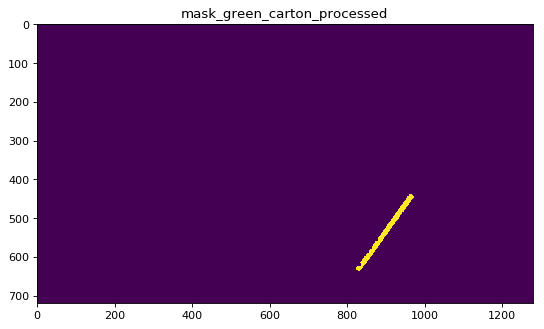

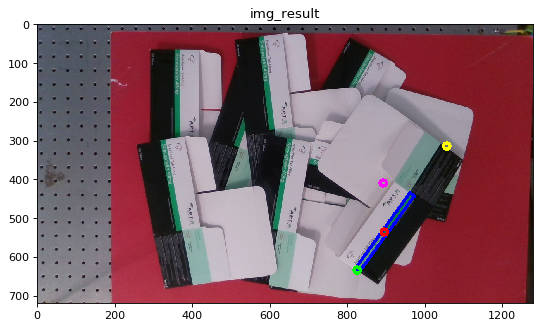

Hong: 1057 316
Kong: 826 635
-125.90972307917767
carton_pose_msg is  header: 
  seq: 4
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.2933406
Hong_y: -0.196011
Kong_x: 0.11355119999999999
Kong_y: 0.4291965
angle: -2.1975392280059434

Hong: 0.2933406   -0.196011
Kong: 0.11355119999999999   0.4291965
1
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  219.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  102.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


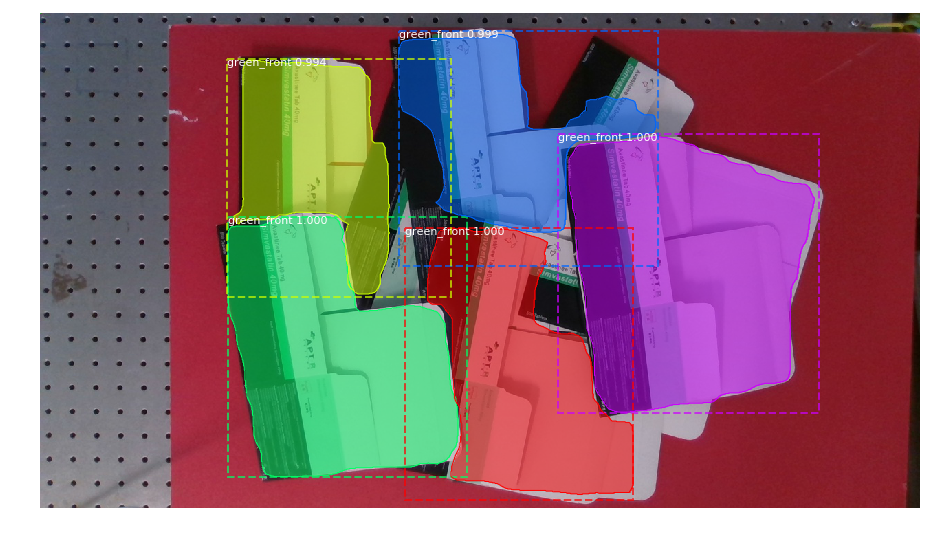

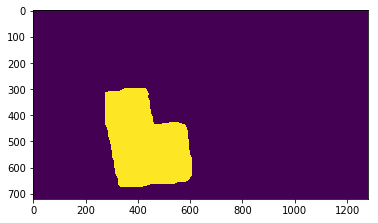

91974


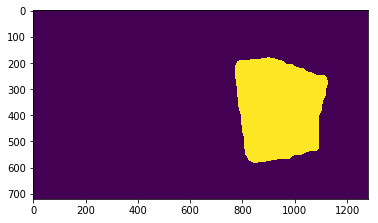

112418


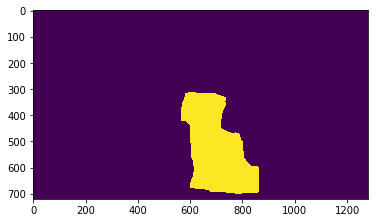

73435


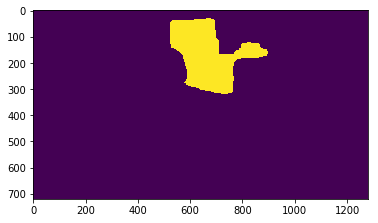

54558


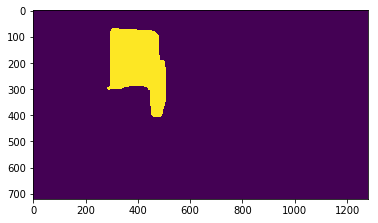

49835


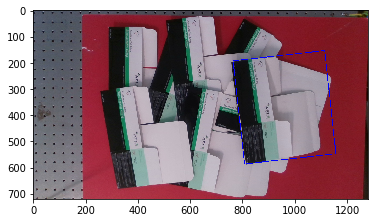

[[ 808  586]
 [ 764  193]
 [1114  154]
 [1157  547]]


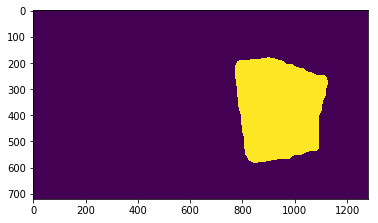

The largest area img is : 1
green_max 255
shape (720, 1280)
dtype uint8
dy = 396 dx=-62


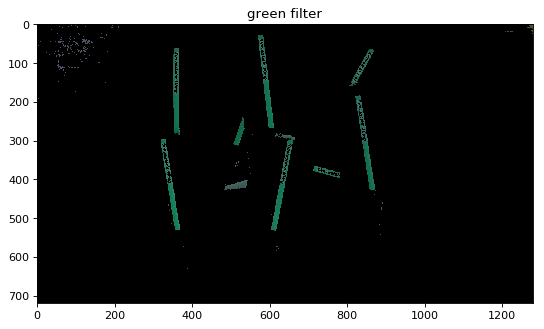

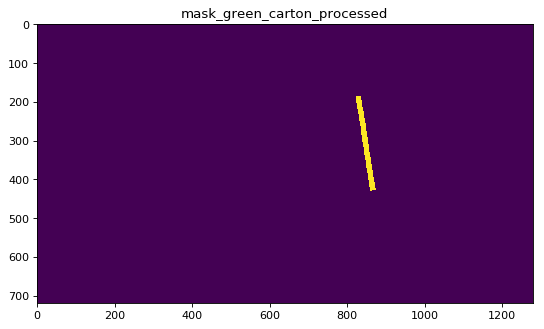

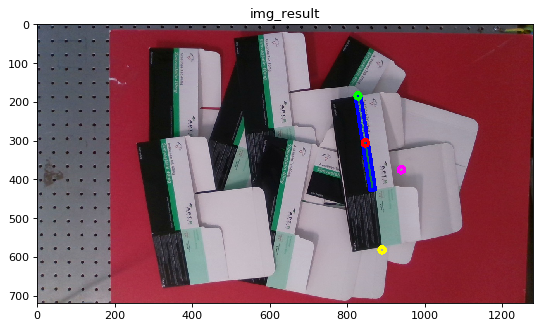

Hong: 890 583
Kong: 828 187
98.89831306446261
carton_pose_msg is  header: 
  seq: 5
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.1804653
Hong_y: -0.015545699999999999
Kong_x: 0.11490299999999999
Kong_y: 0.1263933
angle: 1.7261011876429955

Hong: 0.1804653   -0.015545699999999999
Kong: 0.11490299999999999   0.1263933
2
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  220.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  101.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


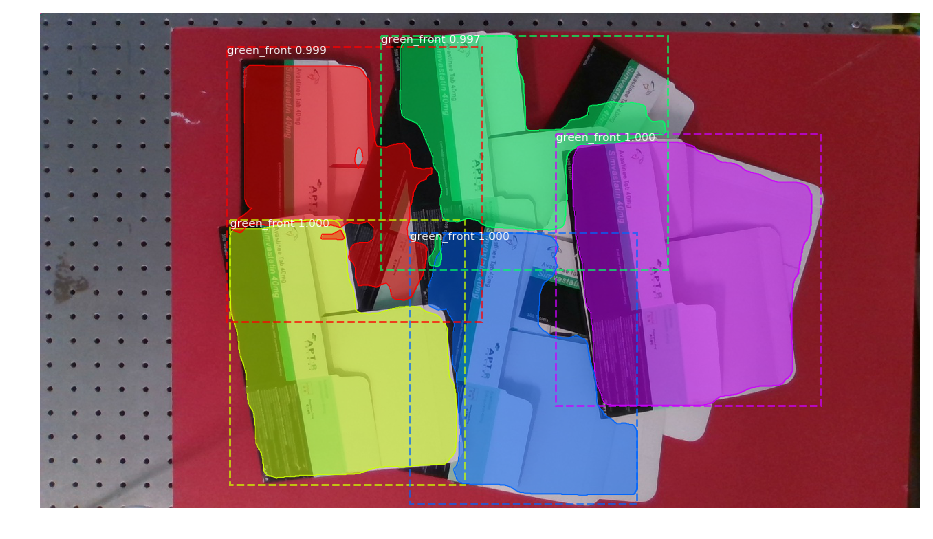

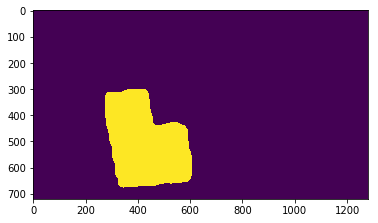

90881


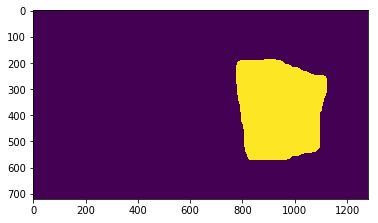

110490


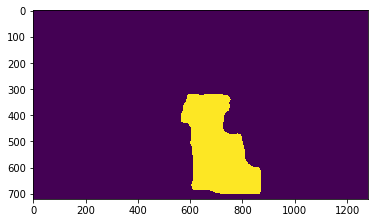

74778


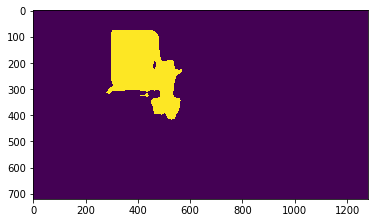

58105


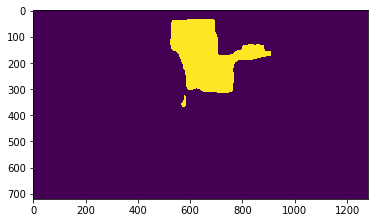

56607


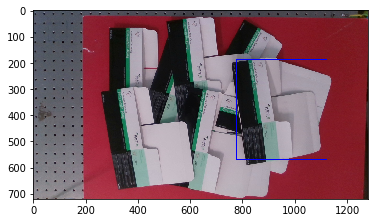

[[ 776  570]
 [ 776  187]
 [1123  187]
 [1123  570]]


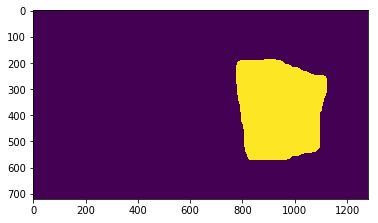

The largest area img is : 1
green_max 255
shape (720, 1280)
dtype uint8
dy = 408 dx=-64


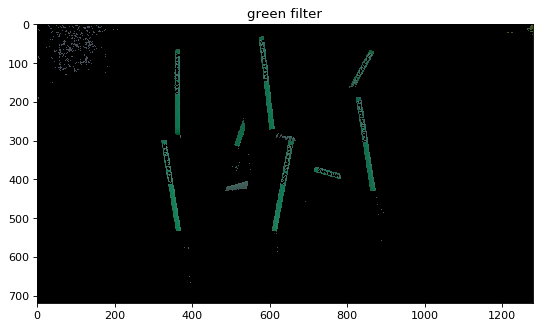

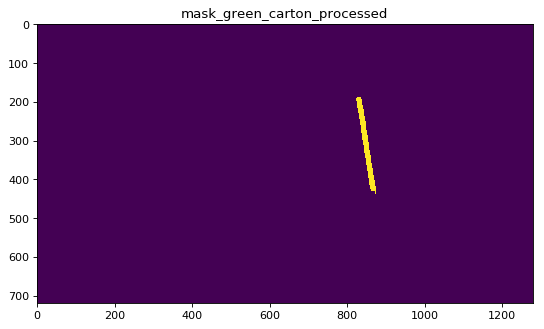

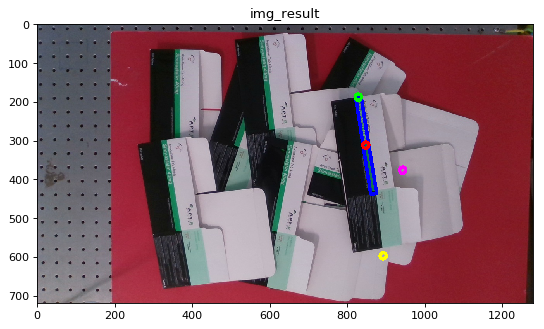

Hong: 893 598
Kong: 829 190
98.91492695714787
carton_pose_msg is  header: 
  seq: 6
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.182493
Hong_y: -0.0054072
Kong_x: 0.1155789
Kong_y: 0.128421
angle: 1.7263911547719264

Hong: 0.182493   -0.0054072
Kong: 0.1155789   0.128421
3
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


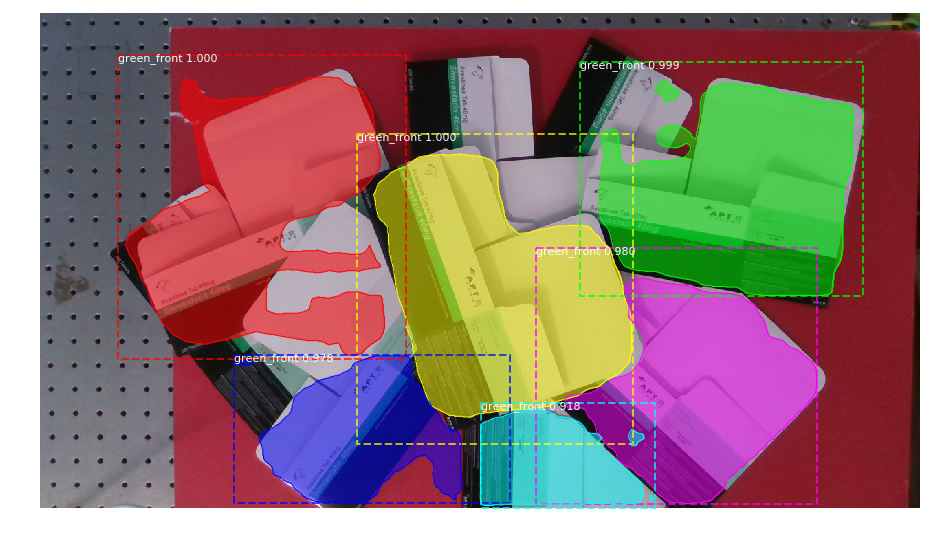

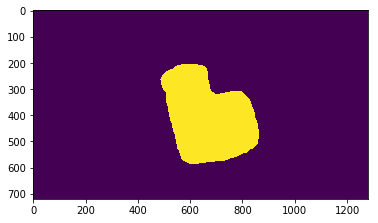

97915


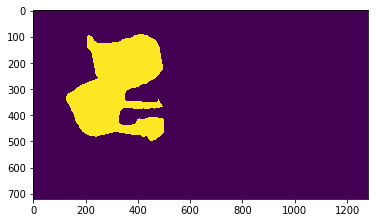

94727


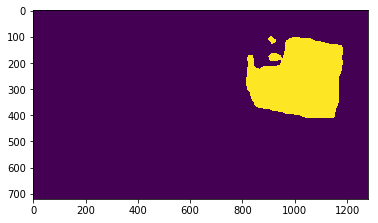

86996


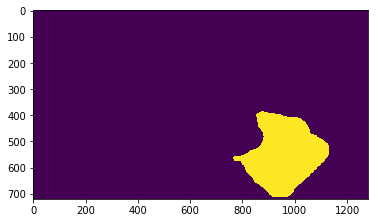

69129


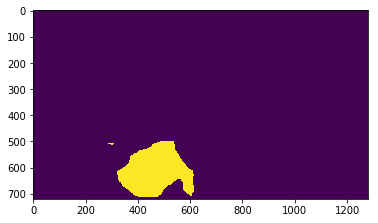

41413


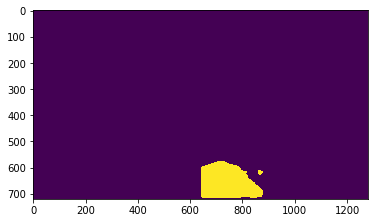

25768


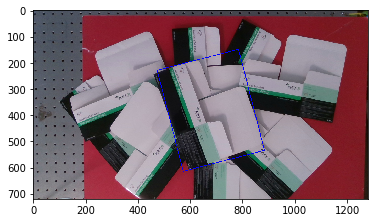

[[574 614]
 [474 229]
 [785 149]
 [884 534]]


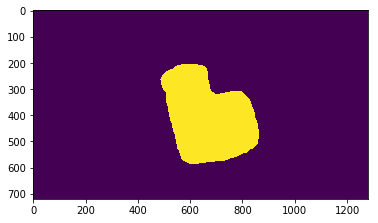

The largest area img is : 0
green_max 255
shape (720, 1280)
dtype uint8
dy = 373 dx=-136


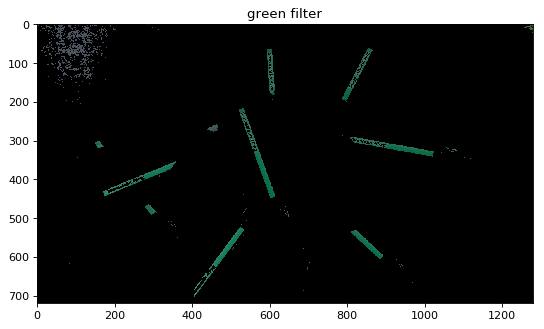

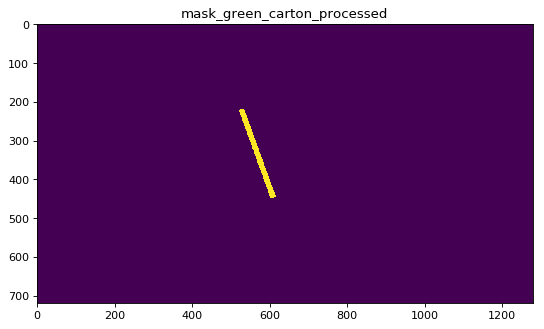

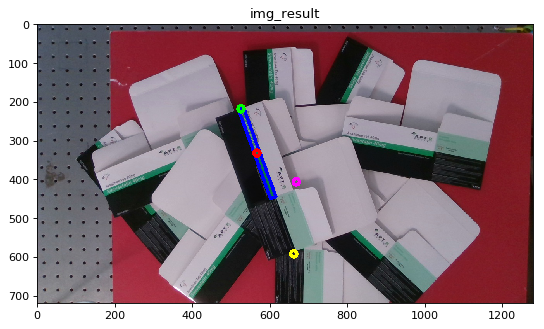

Hong: 662 593
Kong: 526 220
110.03242502016764
carton_pose_msg is  header: 
  seq: 7
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.0263601
Hong_y: -0.0087867
Kong_x: -0.08921879999999999
Kong_y: 0.14869799999999997
angle: 1.9204281005557133

Hong: 0.0263601   -0.0087867
Kong: -0.08921879999999999   0.14869799999999997
4
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


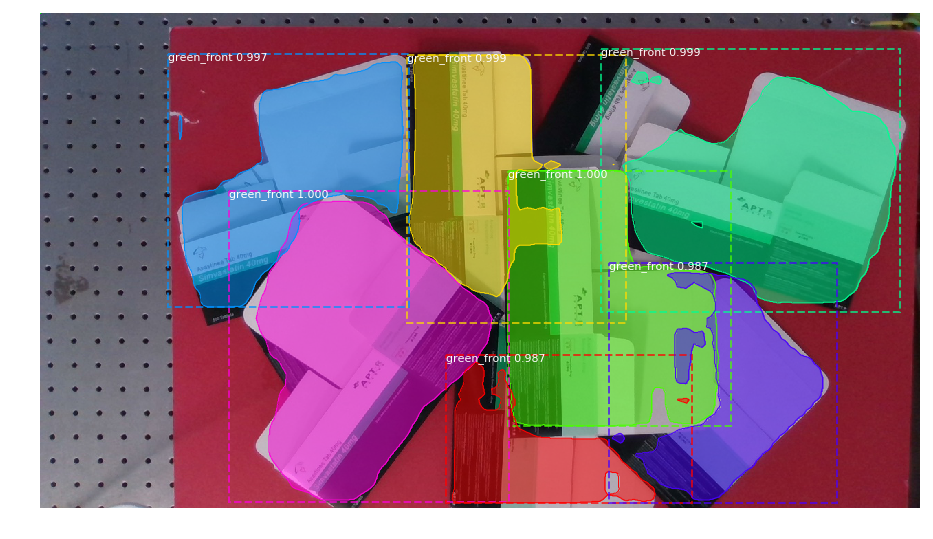

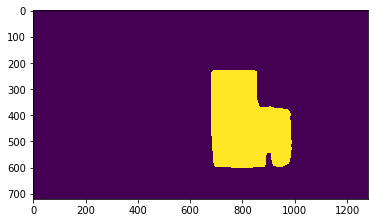

91758


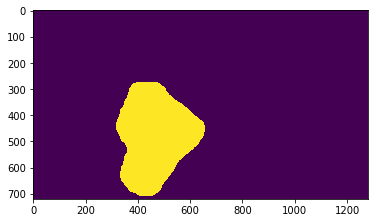

96849


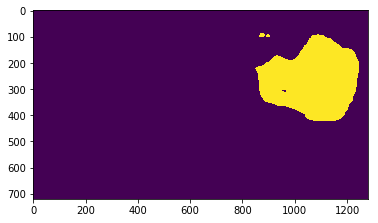

88880


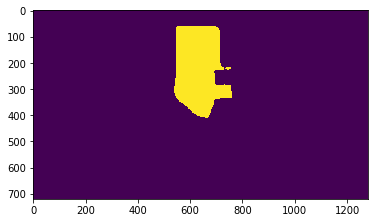

55003


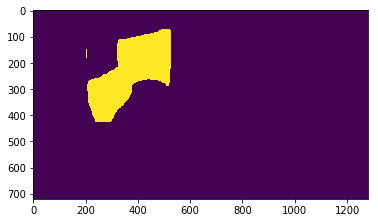

60017


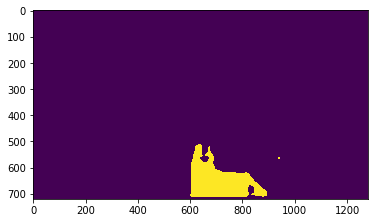

30284


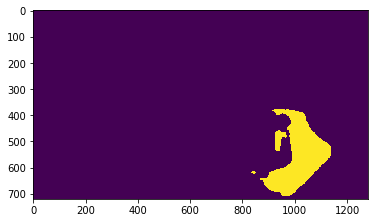

41807


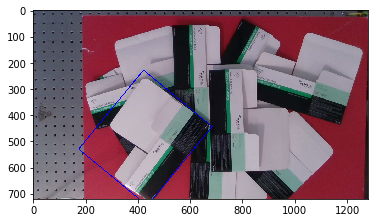

[[436 745]
 [174 529]
 [422 228]
 [684 444]]


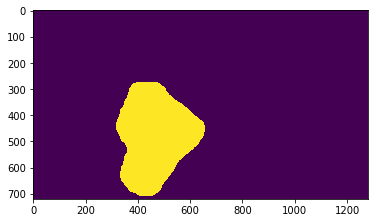

The largest area img is : 1
green_max 255
shape (720, 1280)
dtype uint8
dy = -272 dx=-203


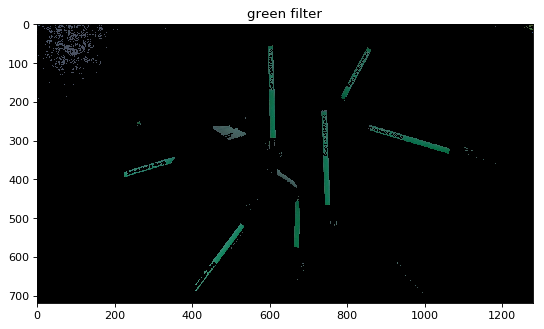

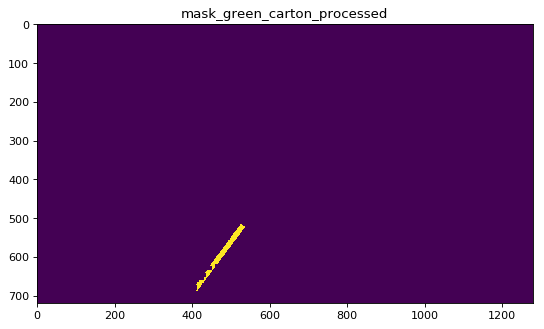

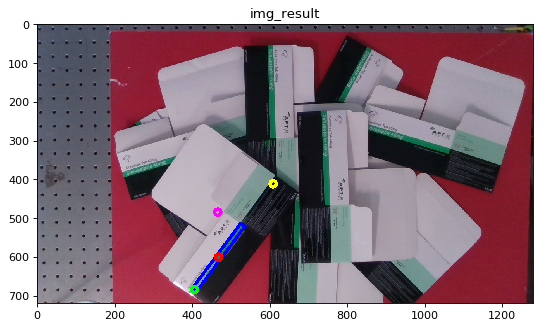

Hong: 609 413
Kong: 406 685
-126.73484597017378
carton_pose_msg is  header: 
  seq: 8
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: -0.009462599999999998
Hong_y: -0.1304487
Kong_x: -0.1703268
Kong_y: 0.4629915
angle: -2.2119403391873997

Hong: -0.009462599999999998   -0.1304487
Kong: -0.1703268   0.4629915
5
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  113.30000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


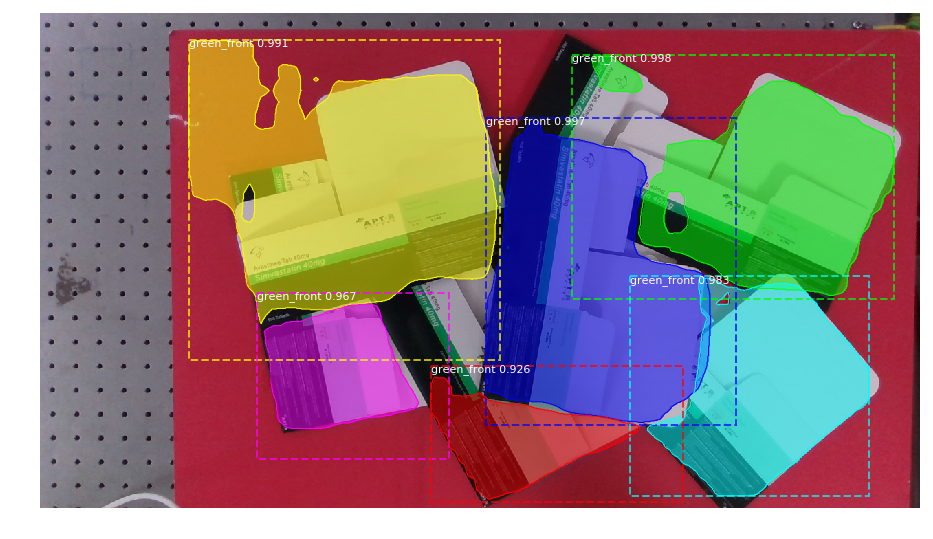

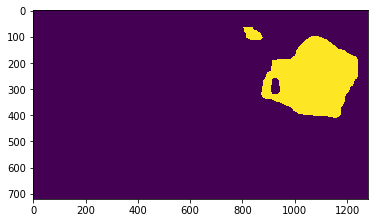

78531


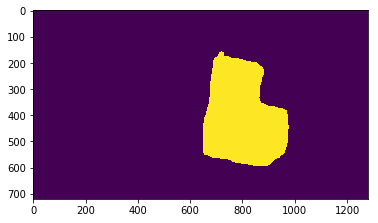

101441


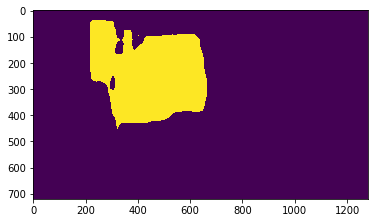

128800


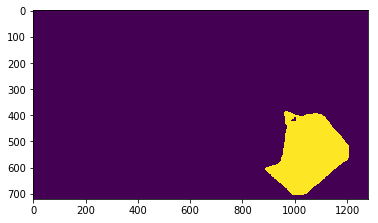

61347


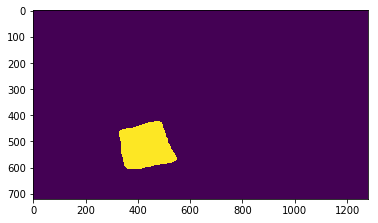

29458


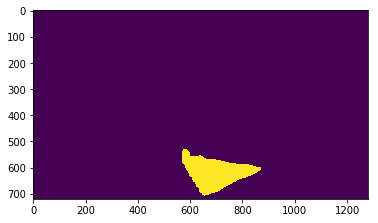

25813


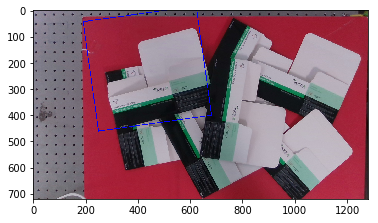

[[250 461]
 [191  44]
 [623 -16]
 [682 400]]


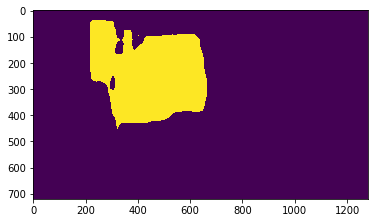

The largest area img is : 2
green_max 255
shape (720, 1280)
dtype uint8
dy = -100 dx=-375


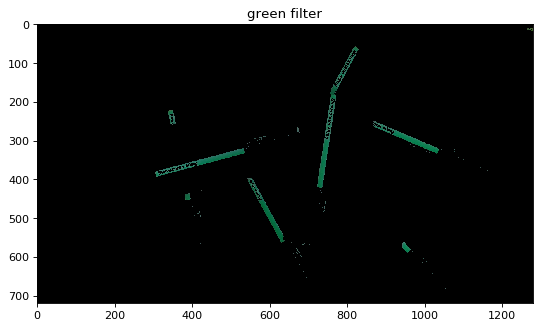

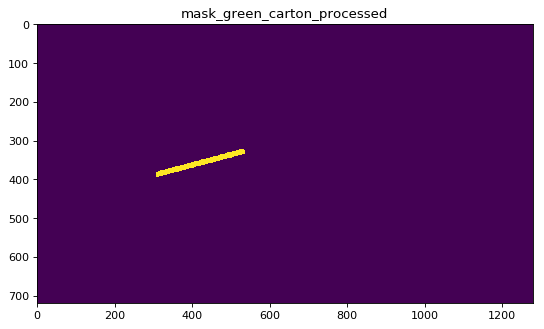

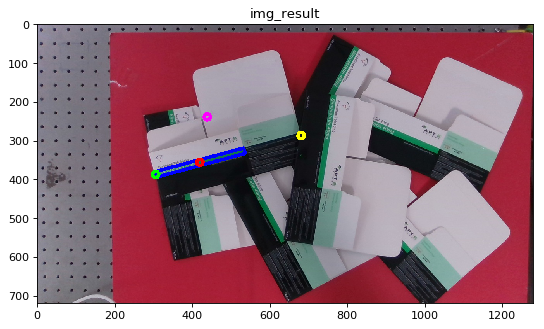

Hong: 681 289
Kong: 306 389
-165.06858282186246
carton_pose_msg is  header: 
  seq: 9
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.0392022
Hong_y: -0.2142603
Kong_x: -0.23791679999999998
Kong_y: 0.26292509999999997
angle: -2.8809902618424523

Hong: 0.0392022   -0.2142603
Kong: -0.23791679999999998   0.26292509999999997
6
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  231.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  106.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


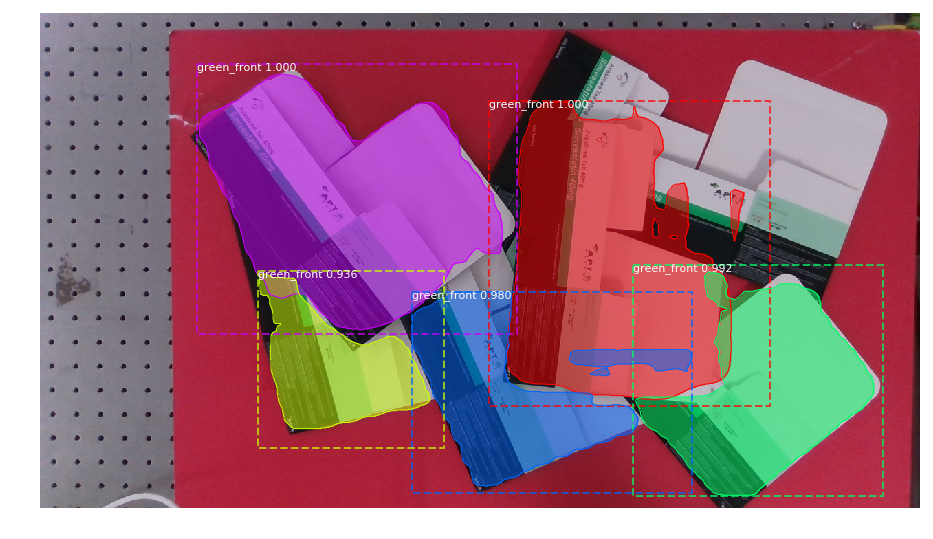

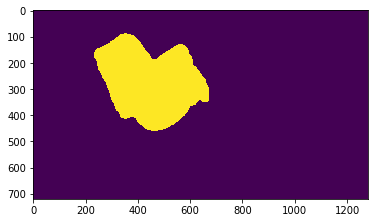

103870


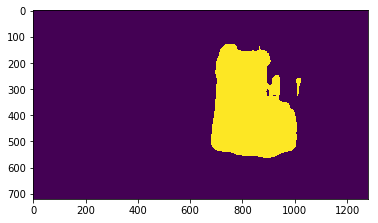

106932


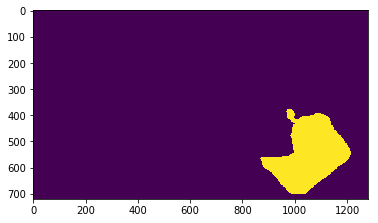

59344


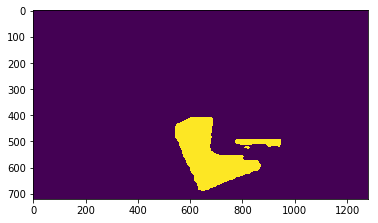

48515


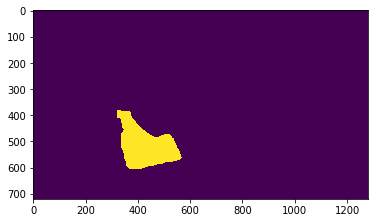

30244


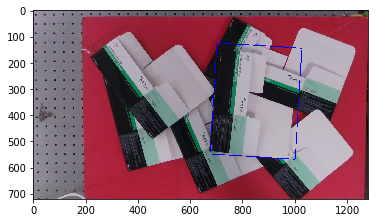

[[1001  568]
 [ 676  548]
 [ 703  125]
 [1027  145]]


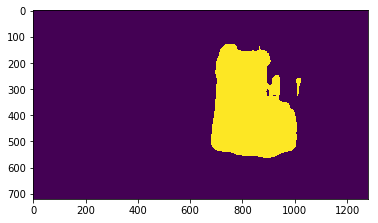

The largest area img is : 1
green_max 255
shape (720, 1280)
dtype uint8
dy = 447 dx=34


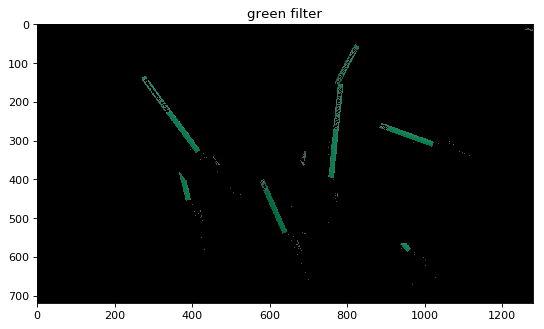

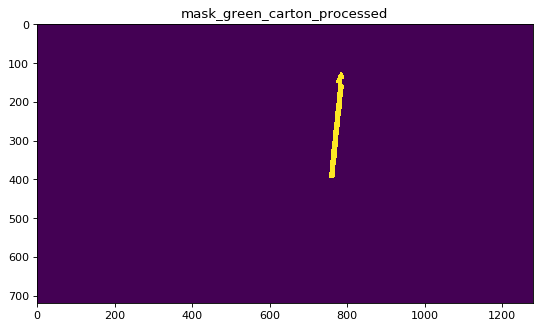

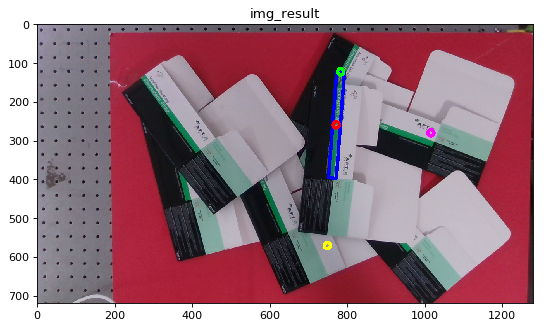

Hong: 749 572
Kong: 783 125
85.65030727591758
carton_pose_msg is  header: 
  seq: 10
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.0851634
Hong_y: -0.0229806
Kong_x: 0.0844875
Kong_y: 0.0844875
angle: 1.494879867309617

Hong: 0.0851634   -0.0229806
Kong: 0.0844875   0.0844875
7
Processing 1 images
image                    shape: (720, 1280, 3)        min:    0.00000  max:  246.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  118.20000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


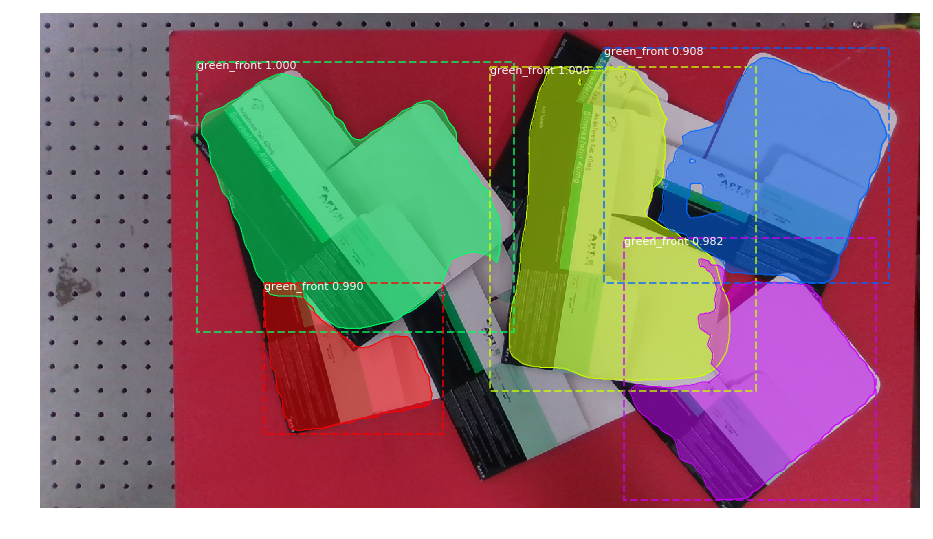

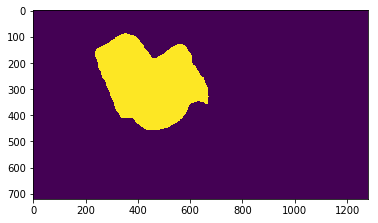

103706


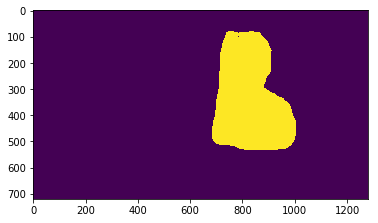

104568


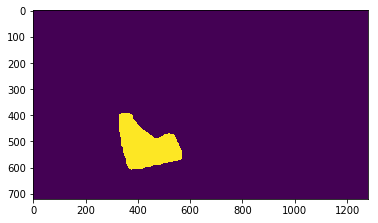

31114


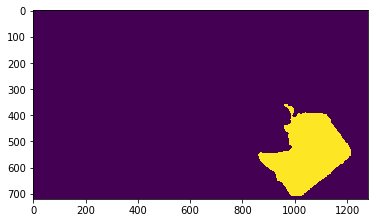

63840


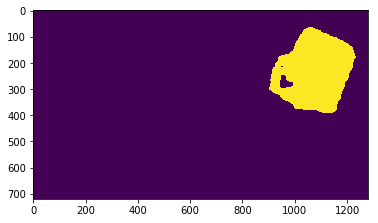

71245


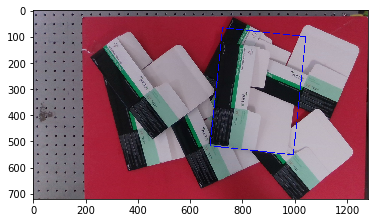

[[ 994  551]
 [ 676  517]
 [ 724   67]
 [1042  101]]


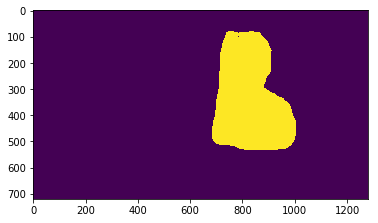

The largest area img is : 1
green_max 255
shape (720, 1280)
dtype uint8
dy = 490 dx=89


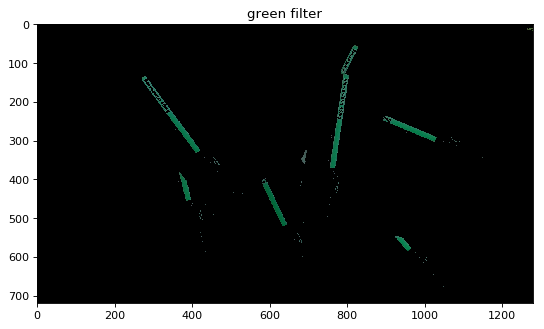

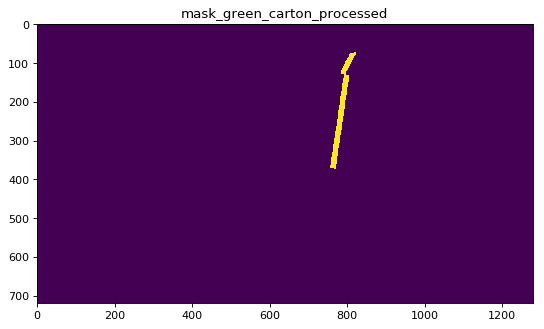

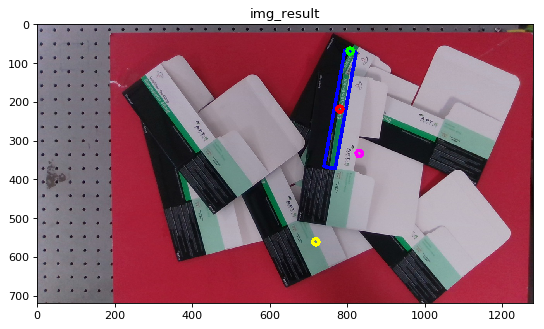

Hong: 719 562
Kong: 808 72
79.70544372140944
carton_pose_msg is  header: 
  seq: 11
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Hong_x: 0.0648864
Hong_y: -0.029739599999999998
Kong_x: 0.10138499999999999
Kong_y: 0.0486648
angle: 1.3911224247016367

Hong: 0.0648864   -0.029739599999999998
Kong: 0.10138499999999999   0.0486648


In [ ]:
# from camera calibration

cx = 658#643#1280
cy = 0#671#720

hong_cx = 623
hong_cy = 606


while(True):
    
    if(is_detect == 1):
        pose_pub = rospy.Publisher('/carton_pose', carton_pose, queue_size=10)
        # Load a the image
        #image = scipy.misc.imread('IMG_0393.JPG')
        
        image = scipy.misc.imread('/home/qxuaj/Desktop/carton_erecting/image/'+ img_index +'.jpeg')

        # Run detection
        results = model.detect([image], verbose=1)
        
        # Visualize results
        r = results[0]
        visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            class_names, r['scores'])
        
        #img = cv2.imread('IMG_0393.JPG',0)
        #img = cv2.imread('/home/qxuaj/Desktop/carton_erecting/imagee/'+ img_index +'.jpeg',0)
        #print(mask_rank(img, r['masks']))
        mask_max, box_max = mask_rank(image, r['masks'])

        plt.imshow(mask_max)
        plt.show()
        
#         pose = get_mask_pose(img, r)
        pose = get_carton_pose(image, r)
        
        print('Hong:', pose['Hong_x'], pose['Hong_y'])
        print('Kong:', pose['Kong_x'], pose['Kong_y'])
        print(pose['rz']*180/math.pi)
        
        carton_pose_msg = carton_pose()
        #carton_pose_msg.x = (pose['x'] - cx) / fx # transfer pixel position to camera frame coordinates
        #carton_pose_msg.y = (pose['y'] - cy) / fy
        carton_pose_msg.Hong_x = (pose['Hong_x'] - hong_cx) * 0.6759 * 0.001 # transfer pixel position to camera frame coordinates
        carton_pose_msg.Hong_y = (pose['Hong_y'] - hong_cy) * 0.6759 * 0.001 #183 165 332
        
        carton_pose_msg.Kong_x = (pose['Kong_x'] - cx) * 0.6759 * 0.001 # transfer pixel position to camera frame coordinates
        carton_pose_msg.Kong_y = (pose['Kong_y'] - cy) * 0.6759 * 0.001 #183 165 332
        
        
        carton_pose_msg.angle = pose['rz']
        pose_pub.publish(carton_pose_msg)
        print('carton_pose_msg is ', carton_pose_msg)
        print()
        print('Hong:', carton_pose_msg.Hong_x, " ", carton_pose_msg.Hong_y)
        print('Kong:', carton_pose_msg.Kong_x, " ", carton_pose_msg.Kong_y)
        
        is_detect = 0

In [18]:
is_detect = 0